# Image similarity search on Azure Cosmos DB for PostgreSQL using the pgvector extension and IVFFlat index

In this notebook, we explore vector similarty search using the IVFFlat index of the pgvector extension on Azure Cosmos DB for PostgreSQL.

Before you start:

1. Create an Azure Cosmos DB for PostgreSQL cluster and enable the `pgvector` extension.
2. Create an Azure Blob Storage container to store the images.
3. Run the `data_preprocessing.ipynb` notebook to clean up the SemArt Dataset and the `generate_embeddings.py` script to compute the embeddings of all the images. The embeddings are saved in the `dataset_embeddings.csv` file in the *dataset* folder.
4. Run the `upload_images_to_blob.py` script to upload the images in your Blob Storage container.
5. Run the `upload_data_to_postgresql_ivfflat.py` script to create a PostgreSQL table, populate it with data, and create an IVFFlat index.

## Import libraries

In [ ]:
import os
import math
import psycopg2
import psycopg2.pool
from dotenv import load_dotenv
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
from azure.storage.blob import ContainerClient

import constants as c
from utils import (
    vectorize_image_with_filepath,
    vectorize_text,
    display_image_grid,
    download_blob,
)

## Load environment variables

In [2]:
load_dotenv("../.env")

# Azure Cosmos DB for PostgreSQL
postgres_host = os.getenv("POSTGRES_HOST")
postgres_database_name = os.getenv("POSTGRES_DB_NAME")
postgres_user = os.getenv("POSTGRES_USER")
postgres_password = os.getenv("POSTGRES_PASSWORD")
sslmode = "require"
table_name = os.getenv("POSTGRES_TABLE_IVFFLAT_NAME")

# Azure AI Vision
vision_endpoint = os.getenv("VISION_ENDPOINT") + "computervision/"
vision_key = os.getenv("VISION_KEY")
vision_api_version = os.getenv("VISION_VERSION")

# Azure Blob Storage credentials
blob_account_name = os.getenv("BLOB_ACCOUNT_NAME")
blob_account_key = os.getenv("BLOB_ACCOUNT_KEY")
blob_endpoint_suffix = os.getenv("BLOB_ENDPOINT_SUFFIX")
blob_connection_string = (
    f"DefaultEndpointsProtocol=https;AccountName={blob_account_name};"
    f"AccountKey={blob_account_key};EndpointSuffix={blob_endpoint_suffix}"
)
container_name = os.getenv("CONTAINER_NAME")

## Create an Azure Blob Storage container client

Create an Azure Blob Storage `ContainerClient` object to download images from your container. Alternatively, you can display the images using their public URL.

In [3]:
blob_container_client = ContainerClient.from_connection_string(
    conn_str=blob_connection_string,
    container_name=container_name,
)

## Connect to Azure Cosmos DB for PostgreSQL

The following code forms a connection string using the environment variables for your Azure Cosmos DB for PostgreSQL cluster and creates a connection pool to your Postgres database. After that, a `cursor` object is created, which can be used to execute SQL queries with the `execute()` method.

In [4]:
# Build a connection string from the variables
postgres_connection_string = (
    f"host={postgres_host} user={postgres_user} dbname={postgres_database_name} "
    f"password={postgres_password} sslmode={sslmode}"
)

In [5]:
postgresql_pool = psycopg2.pool.SimpleConnectionPool(1, 20, postgres_connection_string)
if postgresql_pool:
    print("Connection pool created successfully")

Connection pool created successfully


In [6]:
# Get a connection from the connection pool
conn = postgresql_pool.getconn()
cursor = conn.cursor()

### Select the first 10 rows of the table to see the data

In [7]:
cursor.execute(f"SELECT COUNT(*) FROM {table_name};")
number_of_records = cursor.fetchone()[0]
print(f"Number of records in the table: {number_of_records}")

Number of records in the table: 11206


In [8]:
cursor.execute(f"SELECT * FROM {table_name} LIMIT 10;")
rows = cursor.fetchall()

df_rows = pd.DataFrame(rows, columns=c.COLUMN_NAMES_LIST)
df_rows.head(10)

,image_file,description,author,title,technique,type,timeframe,vector
0,19873-1darmst.jpg,"The Meyer or Darmstadt Madonna is the last, mo...","HOLBEIN, Hans the Younger",Darmstadt Madonna,Oil on limewood,religious,1501-1550,"[-6.2070312,-3.2949219,1.4003906,-1.0898438,-4..."
1,18759-guard301.jpg,Whereas Canaletto incorporates classically ins...,"GUARDI, Francesco",Landscape with a Fisherman's Tent,Oil on canvas,landscape,1751-1800,"[0.6772461,-1.0214844,0.3095703,-1.9599609,-1...."
2,00930-30coron.jpg,Fra Angelico dedicated several of his works to...,"ANGELICO, Fra",The Coronation of the Virgin,Tempera on wood,religious,1401-1450,"[-3.53125,-0.46362305,0.6982422,-0.9916992,-2...."
3,18424-2105grec.jpg,This portrait is an example of El Greco's late...,"GRECO, El",Portrait of Cardinal Tavera,Oil on canvas,portrait,1551-1600,"[-1.2724609,-0.2644043,-0.8095703,-3.0449219,-..."
4,21949-4lastsu3.jpg,Leonardo's painting of the Last Supper was con...,LEONARDO da Vinci,The Last Supper,Mixed technique,religious,1451-1500,"[-1.3525391,1.9355469,0.47802734,-3.25,-2.5175..."
5,39738-04organ.jpg,This is another original version of the Venus ...,TIZIANO Vecellio,Venus and Cupid with an Organist,Oil on canvas,mythological,1501-1550,"[-4.015625,-2.3242188,1.5888672,-6.1679688,-3...."
6,29467-canal_mo.jpg,Aert Van der Neer painted his first moonlit la...,"NEER, Aert van der",A Canal by Moonlight,Oil on oak panel,landscape,1601-1650,"[2.2011719,-0.20983887,1.4208984,-1.3222656,-3..."
7,12035-painstud.jpg,It is assumed that the painter represented in ...,"DOU, Gerrit",Painter in his Studio,Oil on oak,genre,1651-1700,"[0.5541992,-0.24475098,-0.5957031,-1.1962891,-..."
8,36091-4absalo1.jpg,The large scene on the long wall opposite to t...,"SALVIATI, Cecchino del",The Story of David (4 scenes),Fresco,religious,1501-1550,"[-4.46875,-4.375,-1.1943359,-2.8574219,-0.2359..."
9,20109-44hooch.jpg,Pieter de Hooch depicts for us incidents in th...,"HOOCH, Pieter de",Woman Reading a Letter,Oil on canvas,genre,1651-1700,"[-1.8203125,1.9199219,2.1484375,-0.9355469,-5...."


## Search images using an image or a text prompt

After populating the table with vector data and creating an IVFFlat index, you can use this image collection to search for images that are most similar to a reference image or a text prompt. The workflow is summarized as follows:

1. Use the Vectorize Image API or the Vectorize Text API to generate vector embeddings of an image or text, respectively.
2. To calculate similarity and retrieve images, use `SELECT` statements and the built-it vector operators of the PostgreSQL database.
3. Display the retrieved images using the `display_image_grid()` function.

**Notes**:

* When making queries, we have the option to specify the number of probes. PGVector suggests that an appropriate number of probes is `lists/10` for tables up to 1 million rows and `sqrt(lists)` for larger datasets. (In our case, `lists=11`.) The default number of probes is 1.
* We will use the same text prompts and reference images as in the [Exact Nearest Neighbors search example](image_search.ipynb), allowing for a comparison of the accuracy of the results.

In [9]:
TOP_N = 12

Specify the number of probes to use during queries and enforce the utilization of the IVFFlat index

In [10]:
cursor.execute("SET ivfflat.probes = 1;")
cursor.execute("SET enable_seqscan = off;")

### Text-to-Image Search

#### Calculate the vector embedding of the text prompt

Let's search for paintings depicting "a table with flowers."

In [11]:
text_prompt = "a table with flowers"
query_vector = vectorize_text(
    text=text_prompt,
    endpoint=vision_endpoint,
    key=vision_key,
    version=vision_api_version,
)

#### Query the table to find the most similar images

In [12]:
# Vector search
cursor.execute(
    f"SELECT {c.IMAGE_FILE_COLUMN_NAME}, {c.AUTHOR_COLUMN_NAME}, {c.TITLE_COLUMN_NAME} "
    f"FROM {table_name} ORDER BY {c.VECTOR_COLUMN_NAME} <=> %s LIMIT {TOP_N};",
    (str(query_vector),),
)

# Retrieve the results
rows = cursor.fetchall()
df_rows = pd.DataFrame(
    rows,
    columns=[c.IMAGE_FILE_COLUMN_NAME, c.AUTHOR_COLUMN_NAME, c.TITLE_COLUMN_NAME]
)
df_rows.head(TOP_N)

,image_file,author,title
0,11309-411delac.jpg,"DELACROIX, Eugene",A Vase of Flowers on a Console
1,17036-flower09.jpg,"GOGH, Vincent van",Still-Life
2,07635-89d_stil.jpg,CARAVAGGIO,Still-Life with Flowers and Fruit
3,06614-bouquet1.jpg,"BRUEGHEL, Jan the Elder",Bouquet of Flowers
4,19433-flower.jpg,"HEEM, Jan Davidsz. de",Flower Still-life with Crucifix and Skull
5,26109-30young1.jpg,"MEMLING, Hans",Flower Still-life
6,02791-stillif5.jpg,"AST, Balthasar van der",Still-Life with a Basket of Flowers
7,06625-flowers9.jpg,"BRUEGHEL, Jan the Elder",Still-Life of Flowers in a Stoneware Vase
8,38247-stillife.jpg,"STROZZI, Bernardo",Still-Life
9,00100-stillif.jpg,"AELST, Willem van",Still-Life


Display the retrieved images.

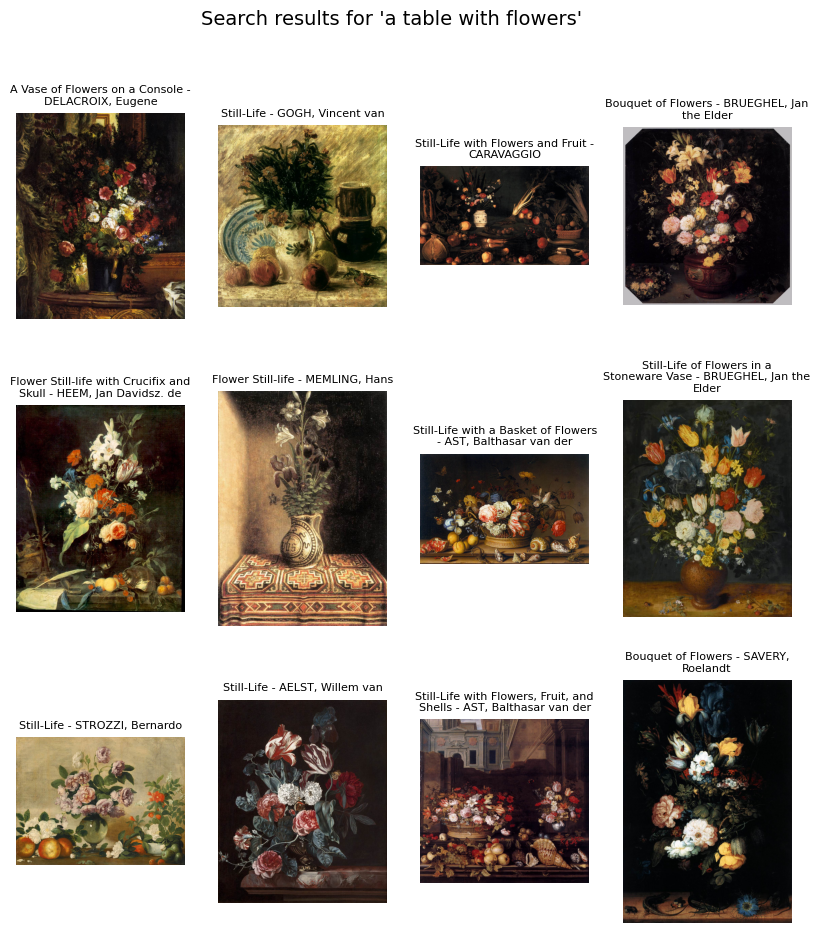

In [13]:
image_names = [row[0] for row in rows]
image_titles = [
    f"{row[2]} - {row[1]}" for row in rows
]
ncols = 4
nrows = math.ceil(len(image_names) / ncols)
display_image_grid(
    image_names=image_names,
    image_titles=image_titles,
    figure_title=f"Search results for '{text_prompt}'",
    nrows=nrows,
    ncols=ncols,
    container_client=blob_container_client,
)

As evident, all the paintings depict a table with flowers. Additionally, using the IVFFlat indexing algorithm, we retrieved 6 out of the 12 paintings obtained with exact search.

Increasing the number of probes is expected to enhance recall, but it will also lead to an increase in speed.

#### Increase the number of probes (for a single query)

In [14]:
# Vector search
cursor.execute(
    f"SET LOCAL ivfflat.probes = 2;"
    f"SELECT {c.IMAGE_FILE_COLUMN_NAME}, {c.AUTHOR_COLUMN_NAME}, {c.TITLE_COLUMN_NAME} "
    f"FROM {table_name} ORDER BY {c.VECTOR_COLUMN_NAME} <=> %s LIMIT {TOP_N};",
    (str(query_vector),),
)
conn.commit()

# Retrieve the results
rows = cursor.fetchall()
df_rows = pd.DataFrame(
    rows,
    columns=[c.IMAGE_FILE_COLUMN_NAME, c.AUTHOR_COLUMN_NAME, c.TITLE_COLUMN_NAME]
)
df_rows.head(TOP_N)

,image_file,author,title
0,11309-411delac.jpg,"DELACROIX, Eugene",A Vase of Flowers on a Console
1,14993-tahiti52.jpg,"GAUGUIN, Paul",A Vase of Flowers
2,14909-early11.jpg,"GAUGUIN, Paul",Still-Life with Mandoline
3,17036-flower09.jpg,"GOGH, Vincent van",Still-Life
4,07635-89d_stil.jpg,CARAVAGGIO,Still-Life with Flowers and Fruit
5,06614-bouquet1.jpg,"BRUEGHEL, Jan the Elder",Bouquet of Flowers
6,17114-3arles28.jpg,"GOGH, Vincent van",Still-Life with Oleanders and Books
7,19433-flower.jpg,"HEEM, Jan Davidsz. de",Flower Still-life with Crucifix and Skull
8,26109-30young1.jpg,"MEMLING, Hans",Flower Still-life
9,02791-stillif5.jpg,"AST, Balthasar van der",Still-Life with a Basket of Flowers


Display the retrieved images.

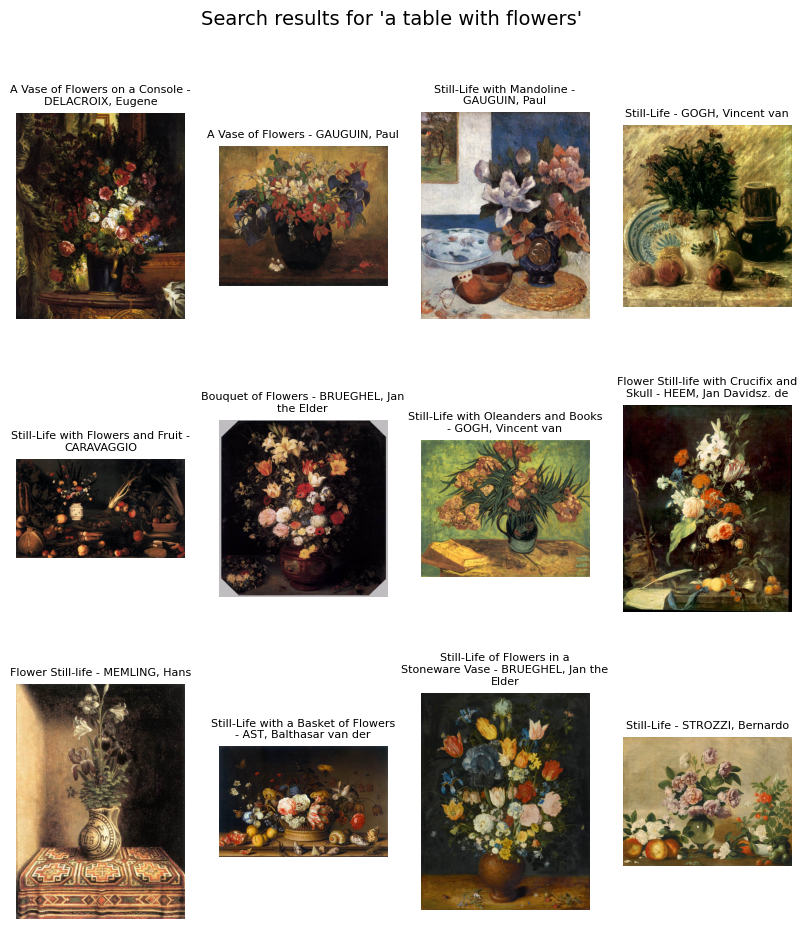

In [15]:
image_names = [row[0] for row in rows]
image_titles = [
    f"{row[2]} - {row[1]}" for row in rows
]
ncols = 4
nrows = math.ceil(len(image_names) / ncols)
display_image_grid(
    image_names=image_names,
    image_titles=image_titles,
    figure_title=f"Search results for '{text_prompt}'",
    nrows=nrows,
    ncols=ncols,
    container_client=blob_container_client,
)

We observe that by increasing the number of probes to 2, we were able to retrieve 9 out of the 12 paintings obtained with exact search.

#### Metadata Filtering

As discussed in the [Exact Nearest Neighbor Search example](image_search.ipynb), implementing accurate and fast metadata filtering in vector search systems is a challenging task. You can read the article [The Missing WHERE Clause in Vector Search](https://www.pinecone.io/learn/vector-search-filtering/) on the Pinecone blog to learn about the two fundamental approaches for metadata filtering and understand the complexities involved in implementing such filters into vector search applications.

When a `WHERE` clause is used alongside an IVFFLAT index, the search process involves performing an approximate nearest neighbor search initially, followed by the application of the `WHERE` clause filter to the results. However, the *post-filtering* approach does **not** guarantee that the desired number of results will be returned.

You can find more information about filtering with the *pgvector* extension on the [pgvector GitHub repository](https://github.com/pgvector/pgvector?tab=readme-ov-file#filtering).

In [16]:
cursor.execute(
    f"SELECT {c.IMAGE_FILE_COLUMN_NAME}, {c.AUTHOR_COLUMN_NAME}, {c.TITLE_COLUMN_NAME} "
    f"FROM {table_name} "
    f"WHERE {c.AUTHOR_COLUMN_NAME} = 'GOGH, Vincent van' "
    f"ORDER BY {c.VECTOR_COLUMN_NAME} <=> %s "
    f"LIMIT {TOP_N};",
    (str(query_vector),),
)

# Retrieve the results
rows = cursor.fetchall()
df_rows = pd.DataFrame(
    rows,
    columns=[c.IMAGE_FILE_COLUMN_NAME, c.AUTHOR_COLUMN_NAME, c.TITLE_COLUMN_NAME]
)
df_rows.head(TOP_N)

,image_file,author,title
0,17036-flower09.jpg,"GOGH, Vincent van",Still-Life
1,17029-flower02.jpg,"GOGH, Vincent van","Vase with Poppies, Cornflowers, Peonies and Ch..."
2,17044-still03.jpg,"GOGH, Vincent van","Still-Life with Apples, Meat and a Roll"
3,17010-nuenen25.jpg,"GOGH, Vincent van",Still-Life with Open Bible
4,17043-still02.jpg,"GOGH, Vincent van","Still-Life with Mackerels, Lemons and Tomatoes"


Display the retrieved images.

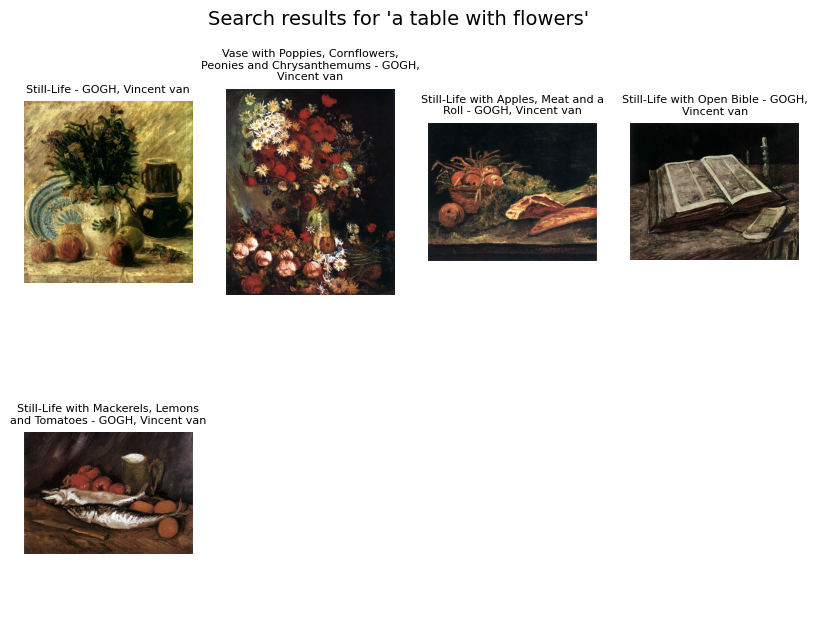

In [17]:
image_names = [row[0] for row in rows]
image_titles = [
    f"{row[2]} - {row[1]}" for row in rows
]
ncols = 4
nrows = math.ceil(len(image_names) / ncols)
display_image_grid(
    image_names=image_names,
    image_titles=image_titles,
    figure_title=f"Search results for '{text_prompt}'",
    nrows=nrows,
    ncols=ncols,
    container_client=blob_container_client,
)

We observe that we were only able to retrieve 5 paintings by Vincent van Gogh. Additionally, only the first 2 paintings are relevant as they depict "a table with flowers", while the remaining ones do not match the search criteria.

#### Retrieve paintings by Vincent van Gogh

As we did in the [Exact Nearest Neighbor Search example](image_search.ipynb), let's explore whether it's possible to retrieve paintings of a specific artist without applying filters by including their name in the text prompt.

In [18]:
text_prompt = "flowers by Vincent van Gogh"
query_vector = vectorize_text(
    text=text_prompt,
    endpoint=vision_endpoint,
    key=vision_key,
    version=vision_api_version,
)

In [19]:
# Vector search
cursor.execute(
    f"SELECT {c.IMAGE_FILE_COLUMN_NAME}, {c.AUTHOR_COLUMN_NAME}, {c.TITLE_COLUMN_NAME} "
    f"FROM {table_name} ORDER BY {c.VECTOR_COLUMN_NAME} <=> %s LIMIT {TOP_N};",
    (str(query_vector),),
)

# Retrieve the results
rows = cursor.fetchall()
df_rows = pd.DataFrame(
    rows,
    columns=[c.IMAGE_FILE_COLUMN_NAME, c.AUTHOR_COLUMN_NAME, c.TITLE_COLUMN_NAME]
)
df_rows.head(TOP_N)

,image_file,author,title
0,17031-flower04.jpg,"GOGH, Vincent van",Vase with Zinnias and Other Flowers
1,17114-3arles28.jpg,"GOGH, Vincent van",Still-Life with Oleanders and Books
2,17038-flower11.jpg,"GOGH, Vincent van",Vase with Daisies and Anemones
3,17033-flower06.jpg,"GOGH, Vincent van",Cineraria in a Flowerpot
4,17034-flower07.jpg,"GOGH, Vincent van",Bowl with Zinnias and Geraniums
5,17035-flower08.jpg,"GOGH, Vincent van",Fritillaries in a Copper Vase
6,17030-flower03.jpg,"GOGH, Vincent van",Vase with Carnations and Other Flowers
7,17239-6still2.jpg,"GOGH, Vincent van",Still-Life: Vase with Irises against a Yellow ...
8,17259-auvers19.jpg,"GOGH, Vincent van",Daubigny's Garden at Auvers
9,17240-6still3.jpg,"GOGH, Vincent van",Vase with Irises


Display the retrieved images.

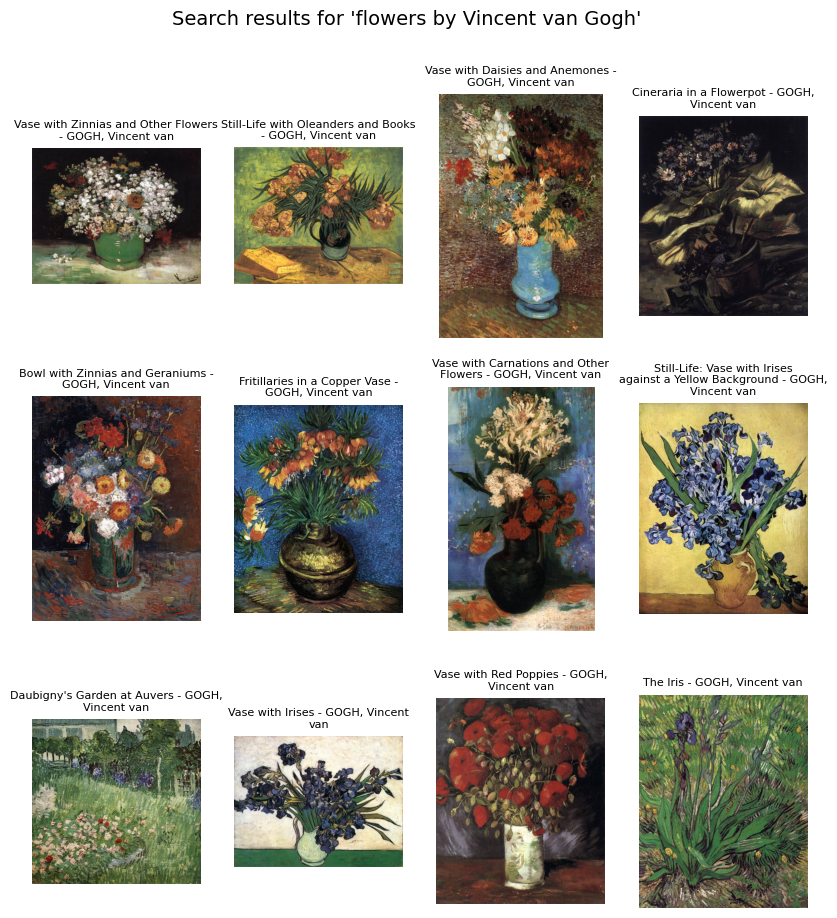

In [20]:
image_names = [row[0] for row in rows]
image_titles = [
    f"{row[2]} - {row[1]}" for row in rows
]
ncols = 4
nrows = math.ceil(len(image_names) / ncols)
display_image_grid(
    image_names=image_names,
    image_titles=image_titles,
    figure_title=f"Search results for '{text_prompt}'",
    nrows=nrows,
    ncols=ncols,
    container_client=blob_container_client,
)

We observe that we retrieve the same paintings as in the exact search.

#### Performance

Using the `EXPLAIN ANALYZE` keywords, we can investigate the execution plan and display the performance of the similarity search query.

In [21]:
# Helper function that displays the query plan (and removes the query vector to imporve readablity)
def print_execution_plan(rows):
    for row in rows:
        print(row[0].replace(str(query_vector).replace(" ", ""), f"[{query_vector[0]}, ..., {query_vector[-1]}]"))

In [22]:
cursor.execute(
    f"EXPLAIN ANALYZE "
    f"SELECT {c.IMAGE_FILE_COLUMN_NAME}, {c.AUTHOR_COLUMN_NAME}, {c.TITLE_COLUMN_NAME} "
    f"FROM {table_name} ORDER BY {c.VECTOR_COLUMN_NAME} <=> %s LIMIT {TOP_N};",
    (str(query_vector),),
)
rows = cursor.fetchall()
print_execution_plan(rows)

Limit  (cost=1537.64..1539.15 rows=12 width=72) (actual time=1.803..1.984 rows=12 loops=1)
  ->  Index Scan using paintings_ivfflat_vector_idx on paintings_ivfflat  (cost=1537.64..2951.85 rows=11206 width=72) (actual time=1.801..1.981 rows=12 loops=1)
        Order By: (vector <=> '[0.001363333, ..., -0.0010466448]'::vector)
Planning Time: 0.135 ms
Execution Time: 2.014 ms


Let's explore one more example. In the [Exact Nearest Neighbor Search example](image_search.ipynb), we used the following query to retrieve the cosine similarity between the query vector and every vector in our database:

```python
cursor.execute(
    f"EXPLAIN ANALYZE "
    f"SELECT {c.IMAGE_FILE_COLUMN_NAME}, {c.AUTHOR_COLUMN_NAME}, {c.TITLE_COLUMN_NAME}, "
    f"1 - ({c.VECTOR_COLUMN_NAME} <=> %s) AS cosine_similarity "
    f"FROM {table_name} ORDER BY cosine_similarity DESC LIMIT {TOP_N};",
    (str(query_vector),),
)
```

Using the `EXPLAIN ANALYZE` keywords, we see that this query does not utilize the IVFFlat index, which leads to a high execution time. This results from sorting `cosine_similarity` in descending order, as pgvector only supports ascending order index scans.

In [23]:
cursor.execute(
    f"EXPLAIN ANALYZE "
    f"SELECT {c.IMAGE_FILE_COLUMN_NAME}, {c.AUTHOR_COLUMN_NAME}, {c.TITLE_COLUMN_NAME}, "
    f"1 - ({c.VECTOR_COLUMN_NAME} <=> %s) AS cosine_similarity "
    f"FROM {table_name} ORDER BY cosine_similarity DESC LIMIT {TOP_N};",
    (str(query_vector),),
)
rows = cursor.fetchall()
print_execution_plan(rows)

Limit  (cost=10000001482.99..10000001483.02 rows=12 width=72) (actual time=83.268..83.271 rows=12 loops=1)
  ->  Sort  (cost=10000001482.99..10000001511.00 rows=11206 width=72) (actual time=83.266..83.268 rows=12 loops=1)
        Sort Key: (('1'::double precision - (vector <=> '[0.001363333, ..., -0.0010466448]'::vector))) DESC
        Sort Method: top-N heapsort  Memory: 28kB
        ->  Seq Scan on paintings_ivfflat  (cost=10000000000.00..10000001226.09 rows=11206 width=72) (actual time=0.029..79.760 rows=11206 loops=1)
Planning Time: 0.354 ms
Execution Time: 83.302 ms


Let's rewrite the query in order to utilize the IVFFlat index.

In [24]:
cursor.execute(
    f"EXPLAIN ANALYZE "
    f"SELECT {c.IMAGE_FILE_COLUMN_NAME}, {c.AUTHOR_COLUMN_NAME}, {c.TITLE_COLUMN_NAME}, "
    f"{c.VECTOR_COLUMN_NAME} <=> %s AS cosine_distance "
    f"FROM {table_name} ORDER BY cosine_distance LIMIT {TOP_N};",
    (str(query_vector),),
)
rows = cursor.fetchall()
print_execution_plan(rows)

Limit  (cost=1537.64..1539.15 rows=12 width=72) (actual time=1.163..1.278 rows=12 loops=1)
  ->  Index Scan using paintings_ivfflat_vector_idx on paintings_ivfflat  (cost=1537.64..2951.85 rows=11206 width=72) (actual time=1.162..1.275 rows=12 loops=1)
        Order By: (vector <=> '[0.001363333, ..., -0.0010466448]'::vector)
Planning Time: 0.137 ms
Execution Time: 1.309 ms


### Image-to-Image Search

#### Calculate the vector embeddings of the reference image

We will use the painting [*Still Life with Flowers* by Charles Ginner](https://artuk.org/discover/artworks/still-life-with-flowers-8115/search/actor:ginner-charles-18781952/page/1/view_as/grid).

In [25]:
reference_image = "reference_image.jpg"
query_vector = vectorize_image_with_filepath(
    image_filepath=reference_image,
    endpoint=vision_endpoint,
    key=vision_key,
    version=vision_api_version,
)

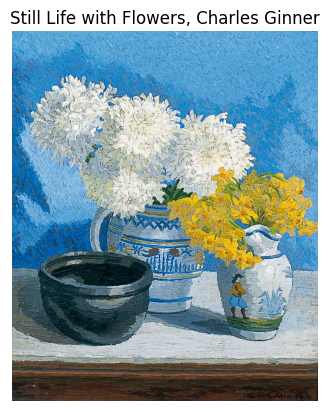

In [26]:
# Display the reference image
plt.imshow(Image.open(reference_image))
plt.axis("off")
plt.title("Still Life with Flowers, Charles Ginner")
plt.show()

#### Query the table to find the most similar images

In [27]:
# Vector search
cursor.execute(
    f"SELECT {c.IMAGE_FILE_COLUMN_NAME}, {c.AUTHOR_COLUMN_NAME}, {c.TITLE_COLUMN_NAME} "
    f"FROM {table_name} ORDER BY {c.VECTOR_COLUMN_NAME} <=> %s LIMIT {TOP_N};",
    (str(query_vector),),
)

# Retrieve the results
rows = cursor.fetchall()
df_rows = pd.DataFrame(
    rows,
    columns=[c.IMAGE_FILE_COLUMN_NAME, c.AUTHOR_COLUMN_NAME, c.TITLE_COLUMN_NAME]
)
df_rows.head(TOP_N)

,image_file,author,title
0,08520-3still1.jpg,"CEZANNE, Paul",Bouquet of Flowers in a Blue Vase
1,17034-flower07.jpg,"GOGH, Vincent van",Bowl with Zinnias and Geraniums
2,14909-early11.jpg,"GAUGUIN, Paul",Still-Life with Mandoline
3,14993-tahiti52.jpg,"GAUGUIN, Paul",A Vase of Flowers
4,17037-flower10.jpg,"GOGH, Vincent van",Vase with Cornflowers and Poppies
5,17030-flower03.jpg,"GOGH, Vincent van",Vase with Carnations and Other Flowers
6,17033-flower06.jpg,"GOGH, Vincent van",Cineraria in a Flowerpot
7,17038-flower11.jpg,"GOGH, Vincent van",Vase with Daisies and Anemones
8,28609-1north3.jpg,"MONET, Claude",Bouquet of Flowers
9,08567-4still4.jpg,"CEZANNE, Paul",Still-Life with a Curtain


Display the retrieved images.

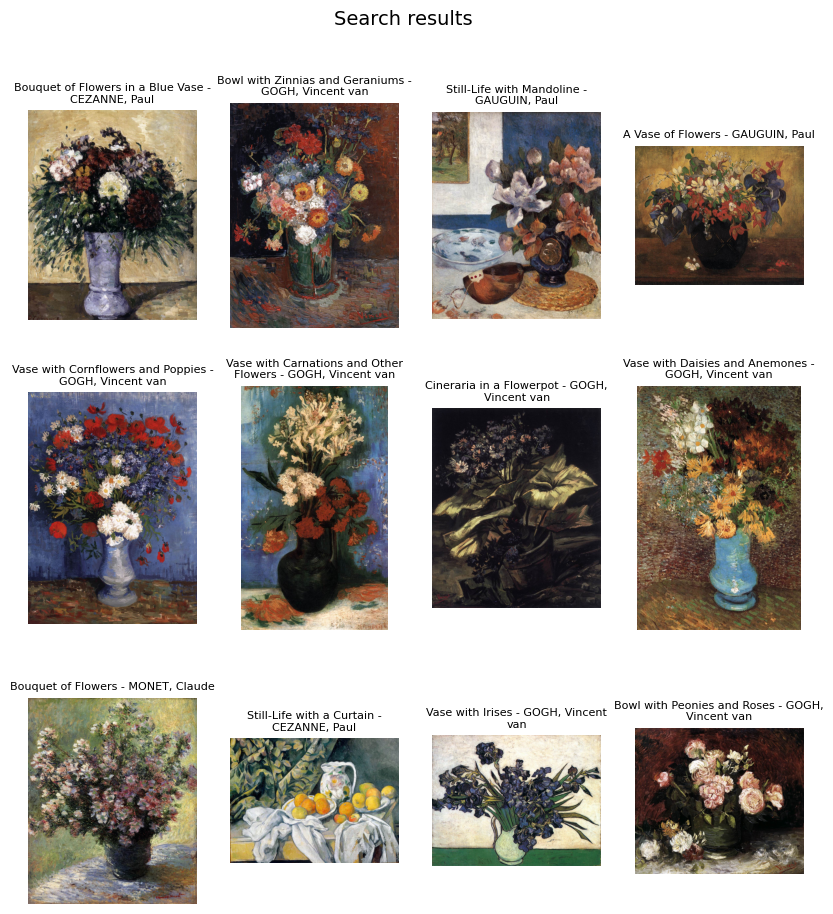

In [28]:
image_names = [row[0] for row in rows]
image_titles = [
    f"{row[2]} - {row[1]}" for row in rows
]
ncols = 4
nrows = math.ceil(len(image_names) / ncols)
display_image_grid(
    image_names=image_names,
    image_titles=image_titles,
    figure_title="Search results",
    nrows=nrows,
    ncols=ncols,
    container_client=blob_container_client,
)

We observe that we were able to retrieve 9 out of the 12 paintings obtained with exact search. Let's increase the number of probes to assess whether we can achieve a better recall.

#### Increase the number of probes (for a single query)

In [29]:
# Vector search
cursor.execute(
    f"SET LOCAL ivfflat.probes = 2;"
    f"SELECT {c.IMAGE_FILE_COLUMN_NAME}, {c.AUTHOR_COLUMN_NAME}, {c.TITLE_COLUMN_NAME} "
    f"FROM {table_name} ORDER BY {c.VECTOR_COLUMN_NAME} <=> %s LIMIT {TOP_N};",
    (str(query_vector),),
)
conn.commit()

# Retrieve the results
rows = cursor.fetchall()
df_rows = pd.DataFrame(
    rows,
    columns=[c.IMAGE_FILE_COLUMN_NAME, c.AUTHOR_COLUMN_NAME, c.TITLE_COLUMN_NAME]
)
df_rows.head(TOP_N)

,image_file,author,title
0,17036-flower09.jpg,"GOGH, Vincent van",Still-Life
1,08520-3still1.jpg,"CEZANNE, Paul",Bouquet of Flowers in a Blue Vase
2,17034-flower07.jpg,"GOGH, Vincent van",Bowl with Zinnias and Geraniums
3,14909-early11.jpg,"GAUGUIN, Paul",Still-Life with Mandoline
4,14993-tahiti52.jpg,"GAUGUIN, Paul",A Vase of Flowers
5,17037-flower10.jpg,"GOGH, Vincent van",Vase with Cornflowers and Poppies
6,17030-flower03.jpg,"GOGH, Vincent van",Vase with Carnations and Other Flowers
7,23815-6stilli1.jpg,"MANET, Edouard",Vase of Peonies on a Pedestal
8,17033-flower06.jpg,"GOGH, Vincent van",Cineraria in a Flowerpot
9,17038-flower11.jpg,"GOGH, Vincent van",Vase with Daisies and Anemones


Display the retrieved images.

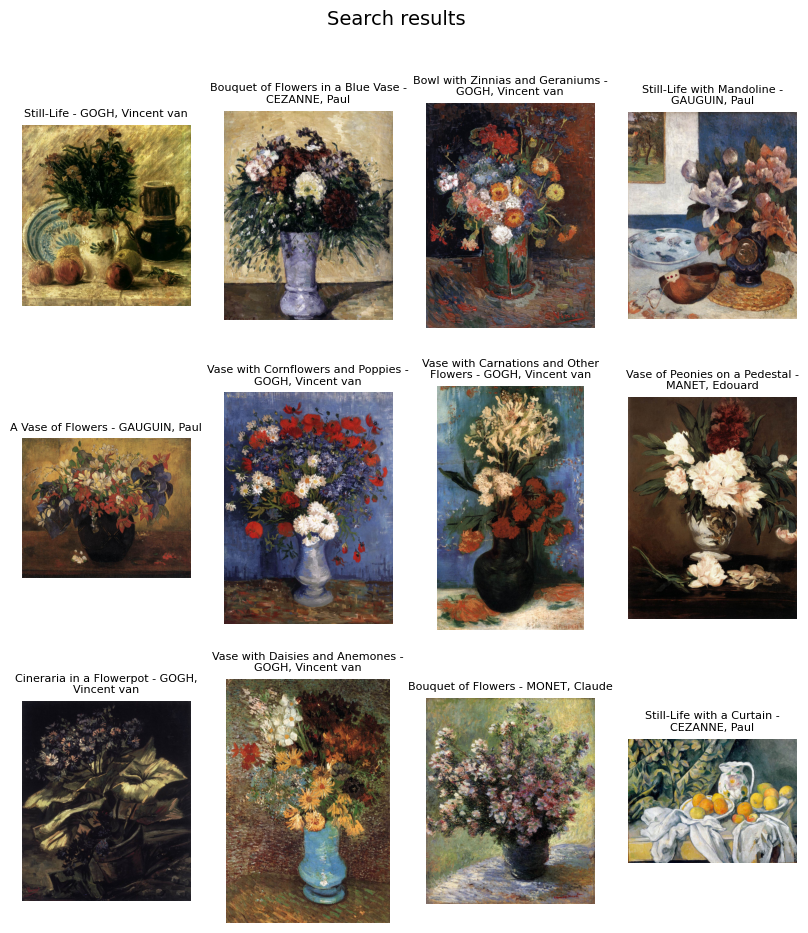

In [30]:
image_names = [row[0] for row in rows]
image_titles = [
    f"{row[2]} - {row[1]}" for row in rows
]
ncols = 4
nrows = math.ceil(len(image_names) / ncols)
display_image_grid(
    image_names=image_names,
    image_titles=image_titles,
    figure_title="Search results",
    nrows=nrows,
    ncols=ncols,
    container_client=blob_container_client,
)

We observe that by increasing the number of probes to 2, we were able to retrieve 11 out of the 12 paintings obtained with exact search.

#### Find the most similar images to an image of the dataset

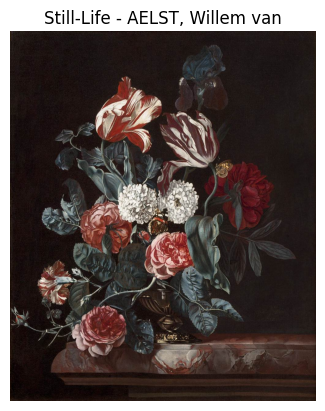

In [31]:
image_file = "00100-stillif.jpg"

# Download the image from Azure Blob Storage
image_stream = download_blob(
    image_filename=image_file,
    container_client=blob_container_client,
)

# Retrieve image metadata
cursor.execute(
    f"SELECT {c.AUTHOR_COLUMN_NAME}, {c.TITLE_COLUMN_NAME} "
    f"FROM {table_name} "
    f"WHERE {c.IMAGE_FILE_COLUMN_NAME} = %s;",
    (image_file,),
)
metadata = cursor.fetchone()

# Display the reference image
plt.imshow(Image.open(image_stream))
plt.axis("off")
plt.title(f"{metadata[1]} - {metadata[0]}")
plt.show()

In [32]:
cursor.execute(
    f"SELECT {c.IMAGE_FILE_COLUMN_NAME}, {c.AUTHOR_COLUMN_NAME}, {c.TITLE_COLUMN_NAME} "
    f"FROM {table_name} "
    f"WHERE {c.IMAGE_FILE_COLUMN_NAME} != %s "
    f"ORDER BY {c.VECTOR_COLUMN_NAME} <=> (SELECT {c.VECTOR_COLUMN_NAME} FROM {table_name} WHERE {c.IMAGE_FILE_COLUMN_NAME} = %s) "
    f"LIMIT {TOP_N};",
    (image_file, image_file),
)

rows = cursor.fetchall()
df_rows = pd.DataFrame(
    rows,
    columns=[c.IMAGE_FILE_COLUMN_NAME, c.AUTHOR_COLUMN_NAME, c.TITLE_COLUMN_NAME]
)
df_rows.head(TOP_N)

,image_file,author,title
0,19473-vase_flo.jpg,"HEEM, Jan Davidsz. de",Vase of Flowers
1,00095-stilflow.jpg,"AELST, Willem van",Still-Life
2,00107-vasewatc.jpg,"AELST, Willem van",Vase of Flowers with Pocket Watch
3,19435-flowvase.jpg,"HEEM, Jan Davidsz. de",Vase with Flowers
4,19455-festoon2.jpg,"HEEM, Jan Davidsz. de",Festoon with Flowers and Fruit
5,02782-flowvase.jpg,"AST, Balthasar van der",Flowers in a Vase with Shells and Insects
6,00101-stillife.jpg,"AELST, Willem van",Flower Still-Life
7,36423-bouquet.jpg,"SAVERY, Roelandt",Bouquet of Flowers
8,06625-flowers9.jpg,"BRUEGHEL, Jan the Elder",Still-Life of Flowers in a Stoneware Vase
9,06620-flowers4.jpg,"BRUEGHEL, Jan the Elder",Flowers in a Vase


Display the retrieved images.

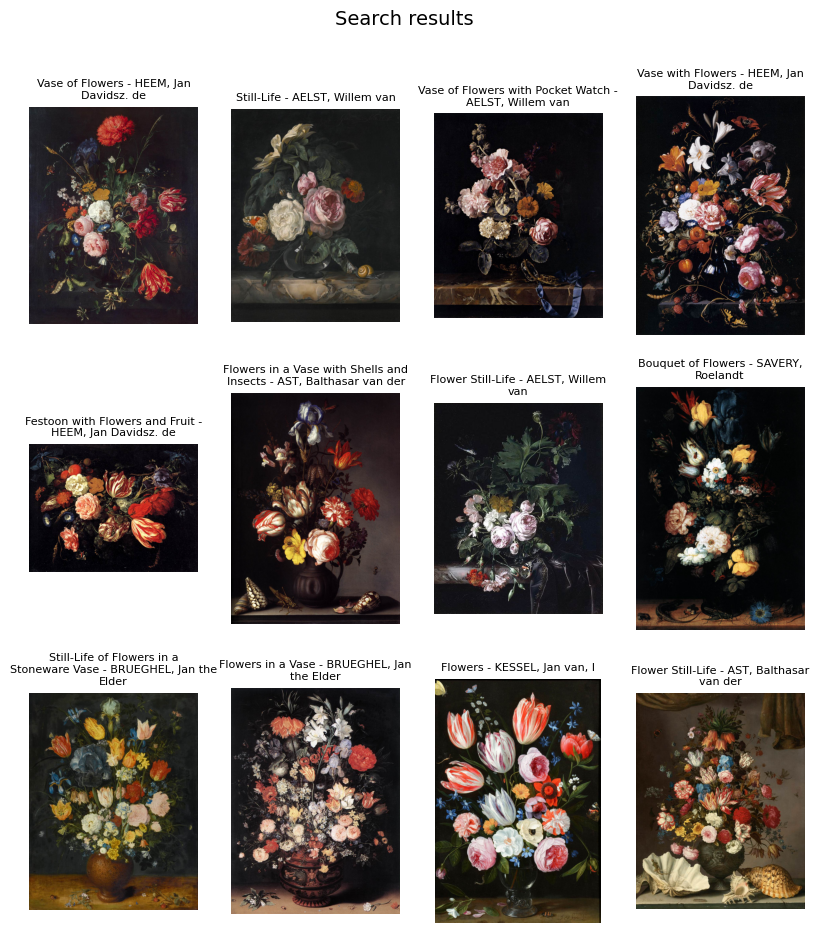

In [33]:
image_names = [row[0] for row in rows]
image_titles = [
    f"{row[2]} - {row[1]}" for row in rows
]
ncols = 4
nrows = math.ceil(len(image_names) / ncols)
display_image_grid(
    image_names=image_names,
    image_titles=image_titles,
    figure_title="Search results",
    nrows=nrows,
    ncols=ncols,
    container_client=blob_container_client,
)

We notice that we retrieve the same paintings as in the exact search. Let's investigate the execution plan.

In [34]:
cursor.execute(
    f"EXPLAIN ANALYZE "
    f"SELECT {c.IMAGE_FILE_COLUMN_NAME}, {c.AUTHOR_COLUMN_NAME}, {c.TITLE_COLUMN_NAME} "
    f"FROM {table_name} "
    f"WHERE {c.IMAGE_FILE_COLUMN_NAME} != %s "
    f"ORDER BY {c.VECTOR_COLUMN_NAME} <=> (SELECT {c.VECTOR_COLUMN_NAME} FROM {table_name} WHERE {c.IMAGE_FILE_COLUMN_NAME} = %s) "
    f"LIMIT {TOP_N};",
    (image_file, image_file),
)
rows = cursor.fetchall()
print_execution_plan(rows)

Limit  (cost=1541.94..1543.46 rows=12 width=72) (actual time=0.850..1.013 rows=12 loops=1)
  InitPlan 1 (returns $0)
    ->  Index Scan using paintings_ivfflat_pkey on paintings_ivfflat paintings_ivfflat_1  (cost=0.29..4.30 rows=1 width=18) (actual time=0.020..0.021 rows=1 loops=1)
          Index Cond: (image_file = '00100-stillif.jpg'::text)
  ->  Index Scan using paintings_ivfflat_vector_idx on paintings_ivfflat  (cost=1537.64..2954.39 rows=11205 width=72) (actual time=0.849..1.010 rows=12 loops=1)
        Order By: (vector <=> $0)
        Filter: (image_file <> '00100-stillif.jpg'::text)
        Rows Removed by Filter: 1
Planning Time: 0.230 ms
Execution Time: 1.055 ms


Let's explore one more example. This time, we will use the painting "Gauguin's Chair" by Vincent van Gogh as a reference.

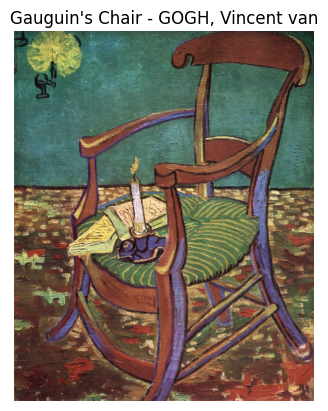

In [35]:
painting_title = "Gauguin's Chair"
cursor.execute(
    f"SELECT {c.IMAGE_FILE_COLUMN_NAME}, {c.AUTHOR_COLUMN_NAME} "
    f"FROM {table_name} "
    f"WHERE {c.TITLE_COLUMN_NAME} = %s;",
    (painting_title,),
)
painting_info = cursor.fetchone()
image_file = painting_info[0]

# Download the image from Azure Blob Storage
image_stream = download_blob(
    image_filename=image_file,
    container_client=blob_container_client,
)

# Display the reference image
plt.imshow(Image.open(image_stream))
plt.axis("off")
plt.title(f"{painting_title} - {painting_info[1]}")
plt.show()

In [36]:
# Vector search
cursor.execute(
    f"SELECT {c.IMAGE_FILE_COLUMN_NAME}, {c.AUTHOR_COLUMN_NAME}, {c.TITLE_COLUMN_NAME} "
    f"FROM {table_name} "
    f"WHERE {c.IMAGE_FILE_COLUMN_NAME} != %s "
    f"ORDER BY {c.VECTOR_COLUMN_NAME} <=> (SELECT {c.VECTOR_COLUMN_NAME} FROM {table_name} WHERE {c.IMAGE_FILE_COLUMN_NAME} = %s) "
    f"LIMIT {TOP_N};",
    (image_file, image_file),
)

# Retrieve the results
rows = cursor.fetchall()
df_rows = pd.DataFrame(
    rows,
    columns=[c.IMAGE_FILE_COLUMN_NAME, c.AUTHOR_COLUMN_NAME, c.TITLE_COLUMN_NAME]
)
df_rows.head(TOP_N)

,image_file,author,title
0,17137-arles59.jpg,"GOGH, Vincent van",Vincent's Chair with His Pipe
1,17230-4earlie1.jpg,"GOGH, Vincent van",Vincent's Bedroom in Arles
2,17114-3arles28.jpg,"GOGH, Vincent van",Still-Life with Oleanders and Books
3,17231-4earlie2.jpg,"GOGH, Vincent van",Vincent's Bedroom in Arles
4,17126-arles48.jpg,"GOGH, Vincent van",Vincent's Bedroom in Arles
5,17049-still08.jpg,"GOGH, Vincent van",Still-Life with French Novels and a Rose
6,17120-arles42.jpg,"GOGH, Vincent van","Cafe Terrace on the Place du Forum, Arles, at ..."
7,17141-arles63.jpg,"GOGH, Vincent van",Sunflowers
8,17083-orchar04.jpg,"GOGH, Vincent van",Orchard in Blossom
9,17038-flower11.jpg,"GOGH, Vincent van",Vase with Daisies and Anemones


Display the retrieved images.

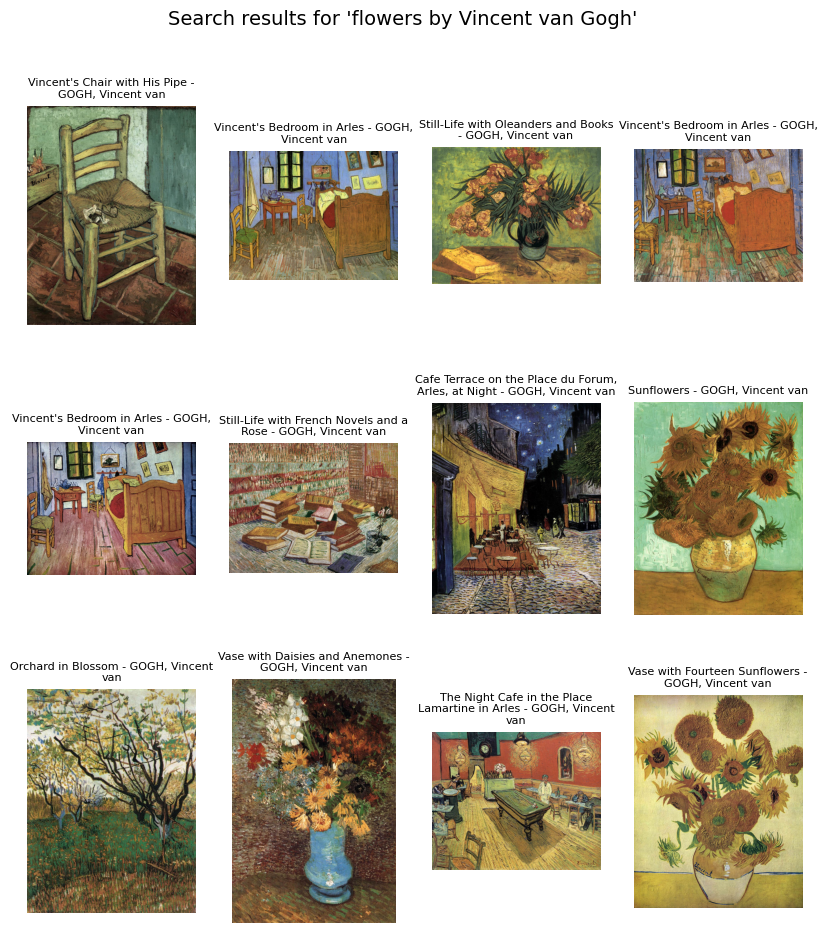

In [37]:
image_names = [row[0] for row in rows]
image_titles = [
    f"{row[2]} - {row[1]}" for row in rows
]
ncols = 4
nrows = math.ceil(len(image_names) / ncols)
display_image_grid(
    image_names=image_names,
    image_titles=image_titles,
    figure_title=f"Search results for '{text_prompt}'",
    nrows=nrows,
    ncols=ncols,
    container_client=blob_container_client,
)

We notice that we were able to retrieve 7 out of the 12 paintings obtained with exact search. You can increase the number of probes for better recall.

In [38]:
cursor.execute(
    f"EXPLAIN ANALYZE "
    f"SELECT {c.IMAGE_FILE_COLUMN_NAME}, {c.AUTHOR_COLUMN_NAME}, {c.TITLE_COLUMN_NAME} "
    f"FROM {table_name} "
    f"WHERE {c.IMAGE_FILE_COLUMN_NAME} != %s "
    f"ORDER BY {c.VECTOR_COLUMN_NAME} <=> (SELECT {c.VECTOR_COLUMN_NAME} FROM {table_name} WHERE {c.IMAGE_FILE_COLUMN_NAME} = %s) "
    f"LIMIT {TOP_N};",
    (image_file, image_file),
)
rows = cursor.fetchall()
print_execution_plan(rows)

Limit  (cost=1541.94..1543.46 rows=12 width=72) (actual time=1.184..1.324 rows=12 loops=1)
  InitPlan 1 (returns $0)
    ->  Index Scan using paintings_ivfflat_pkey on paintings_ivfflat paintings_ivfflat_1  (cost=0.29..4.30 rows=1 width=18) (actual time=0.034..0.035 rows=1 loops=1)
          Index Cond: (image_file = '17138-arles60.jpg'::text)
  ->  Index Scan using paintings_ivfflat_vector_idx on paintings_ivfflat  (cost=1537.64..2954.39 rows=11205 width=72) (actual time=1.183..1.321 rows=12 loops=1)
        Order By: (vector <=> $0)
        Filter: (image_file <> '17138-arles60.jpg'::text)
        Rows Removed by Filter: 1
Planning Time: 0.343 ms
Execution Time: 1.380 ms


## Close the connection

In [39]:
conn.commit()
cursor.close()
conn.close()